<a href="https://colab.research.google.com/github/pierreduke/123/blob/main/train_celeb_xception.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive._mount('/content/drive')

Mounted at /content/drive


**Unzip dataset**

In [2]:
!unzip /content/drive/MyDrive/DatasetCELEB_train.zip

Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
  inflating: DatasetCELEB_train/val/real/30747.jpg  
  inflating: DatasetCELEB_train/val/real/30749.jpg  
  inflating: DatasetCELEB_train/val/real/30756.jpg  
  inflating: DatasetCELEB_train/val/real/30759.jpg  
  inflating: DatasetCELEB_train/val/real/30760.jpg  
  inflating: DatasetCELEB_train/val/real/30766.jpg  
  inflating: DatasetCELEB_train/val/real/30782.jpg  
  inflating: DatasetCELEB_train/val/real/30783.jpg  
  inflating: DatasetCELEB_train/val/real/30785.jpg  
  inflating: DatasetCELEB_train/val/real/30786.jpg  
  inflating: DatasetCELEB_train/val/real/30794.jpg  
  inflating: DatasetCELEB_train/val/real/30796.jpg  
  inflating: DatasetCELEB_train/val/real/30798.jpg  
  inflating: DatasetCELEB_train/val/real/3081.jpg  
  inflating: DatasetCELEB_train/val/real/3082.jpg  
  inflating: DatasetCELEB_train/val/real/30822.jpg  
  inflating: DatasetCELEB_train/val/real/30826.jpg  
  inflating: DatasetCELEB_train/val/real/308

**Cài đặt thư viện model**

In [3]:
# ! pip install git+https://github.com/qubvel/classification_models.git
# ! pip install git+https://github.com/qubvel/segmentation_models

**1) Khai báo các thư viện sử dụng**

In [4]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.models import Sequential



> **1.1) Model thông thường (ResNet, DenseNet, Xception, ResNext)**



In [5]:
from tensorflow.keras.applications import Xception
baseModel = Xception(weights="imagenet", include_top=False, input_tensor=Input(shape=(224,224,3)))
headModel = baseModel.output
headModel = AveragePooling2D(pool_size=(7,7))(headModel)
headModel = Flatten(name="flatten")(headModel)
headModel = Dense(512, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(256, activation="relu")(headModel)
headModel = Dense(2, activation="softmax")(headModel)
model = Model(inputs=baseModel.input, outputs=headModel)
model.summary()

83697664/83683744 [==============================] - 0s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 111, 111, 32  128        ['block1_conv1[0][0]']           
 ation)                      



> **1.2) EfficientNet Model**



In [6]:
# efficient_net = EfficientNetB1(
#     weights = 'imagenet',
#     input_shape = (224, 224, 3),
#     include_top = False,
#     pooling = 'max'
# )

# model = Sequential()
# model.add(efficient_net)
# model.add(Dense(units = 512, activation = 'relu'))
# model.add(Dropout(0.5))
# model.add(Dense(units = 128, activation = 'relu'))
# model.add(Dense(units = 2, activation = 'softmax'))
# model.summary()

In [7]:
model.compile(optimizer = Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

**2) Khởi tạo đường dẫn, checkpoint và callbacks**

In [8]:
train_path = '/content/DatasetCELEB_train/train'
val_path = '/content/DatasetCELEB_train/val'


In [9]:
checkpoint_filepath = '/content/drive/MyDrive/model_checkpoint/'
print('Creating Directory: ' + checkpoint_filepath)
os.makedirs(checkpoint_filepath, exist_ok=True)

Creating Directory: /content/drive/MyDrive/model_checkpoint/


In [10]:
custom_callbacks = [
    EarlyStopping(
        monitor = 'val_loss',
        mode = 'min',
        patience = 5,
        verbose = 1
    ),
    ModelCheckpoint(
        filepath = os.path.join(checkpoint_filepath, 'Xception_CELEB.h5'),
        monitor = 'val_loss',
        mode = 'min',
        verbose = 1,
        save_best_only = True
    )
]

**3) ImageDataGenerator**

In [11]:
train_datagen = ImageDataGenerator(
    rescale = 1/255,
    rotation_range = 10,
    width_shift_range = 0.1,
    height_shift_range = 0.1,
    shear_range = 0.2,
    zoom_range = 0.1,
    horizontal_flip = True,
    fill_mode = 'nearest'
)
train_generator = train_datagen.flow_from_directory(
    directory = train_path,
    target_size = (224,224),
    color_mode = "rgb",
    class_mode = "categorical",
    batch_size = 32,
    shuffle = True
)

val_datagen = ImageDataGenerator(
    rescale = 1/255    #rescale the tensor values to [0,1]
)
val_generator = val_datagen.flow_from_directory(
    directory = val_path,
    target_size = (224,224),
    color_mode = "rgb",
    class_mode = "categorical",
    batch_size = 32,
    shuffle = True
)

Found 77703 images belonging to 2 classes.
Found 19426 images belonging to 2 classes.


In [12]:
len(train_generator)

2429

**4) Huấn luyện**

In [13]:
num_epochs = 20

In [14]:
H = model.fit_generator(
    train_generator,
    epochs = num_epochs,
    steps_per_epoch = len(train_generator),
    validation_data = val_generator,
    validation_steps = len(val_generator),
    callbacks = custom_callbacks
)
print(H.history)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  import sys


Epoch 1/20
2429/2429 [==============================] - ETA: 0s - loss: 0.1173 - accuracy: 0.9529
Epoch 00001: val_loss improved from inf to 0.14862, saving model to /content/drive/MyDrive/model_checkpoint/DenseNet169_CELEB.h5


/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


2429/2429 [==============================] - 982s 399ms/step - loss: 0.1173 - accuracy: 0.9529 - val_loss: 0.1486 - val_accuracy: 0.9501
Epoch 2/20
2429/2429 [==============================] - ETA: 0s - loss: 0.0387 - accuracy: 0.9870
Epoch 00002: val_loss improved from 0.14862 to 0.02318, saving model to /content/drive/MyDrive/model_checkpoint/DenseNet169_CELEB.h5
2429/2429 [==============================] - 970s 399ms/step - loss: 0.0387 - accuracy: 0.9870 - val_loss: 0.0232 - val_accuracy: 0.9919
Epoch 3/20
2429/2429 [==============================] - ETA: 0s - loss: 0.0258 - accuracy: 0.9910
Epoch 00003: val_loss improved from 0.02318 to 0.01349, saving model to /content/drive/MyDrive/model_checkpoint/DenseNet169_CELEB.h5
2429/2429 [==============================] - 969s 399ms/step - loss: 0.0258 - accuracy: 0.9910 - val_loss: 0.0135 - val_accuracy: 0.9949
Epoch 4/20
2429/2429 [==============================] - ETA: 0s - loss: 0.0180 - accuracy: 0.9940
Epoch 00004: val_loss did not

**5) Plot đồ thị train**

In [15]:
import matplotlib.pyplot as plt
acc = H.history['accuracy']
val_acc = H.history['val_accuracy']
loss = H.history['loss']
val_loss = H.history['val_loss']

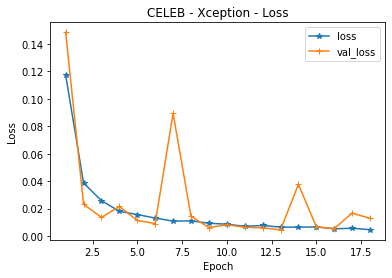

In [16]:
import matplotlib.pyplot as plt
epochs = range(1, len(acc) + 1)

plt.plot(epochs, H.history['loss'], label='loss', marker="*")
plt.plot(epochs, H.history['val_loss'], label='val_loss', marker="+")
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('CELEB - Xception - Loss')
plt.legend()
plt.show()

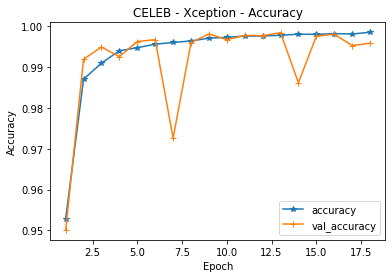

In [17]:
plt.plot(epochs, H.history['accuracy'], label='accuracy', marker="*")
plt.plot(epochs, H.history['val_accuracy'], label='val_accuracy', marker="+")
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('CELEB - Xception - Accuracy')
plt.legend()
plt.show()



---



---



---



---



---



---
**Phần test**


---

---



---



---



---






In [18]:
!unzip /content/drive/MyDrive/DatasetCELEB_test.zip

Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
  inflating: DatasetCELEB_test/real/5450.jpg  
  inflating: DatasetCELEB_test/real/5451.jpg  
  inflating: DatasetCELEB_test/real/5452.jpg  
  inflating: DatasetCELEB_test/real/5453.jpg  
  inflating: DatasetCELEB_test/real/5454.jpg  
  inflating: DatasetCELEB_test/real/5455.jpg  
  inflating: DatasetCELEB_test/real/5456.jpg  
  inflating: DatasetCELEB_test/real/5457.jpg  
  inflating: DatasetCELEB_test/real/5458.jpg  
  inflating: DatasetCELEB_test/real/5459.jpg  
  inflating: DatasetCELEB_test/real/546.jpg  
  inflating: DatasetCELEB_test/real/5460.jpg  
  inflating: DatasetCELEB_test/real/5461.jpg  
  inflating: DatasetCELEB_test/real/5462.jpg  
  inflating: DatasetCELEB_test/real/5463.jpg  
  inflating: DatasetCELEB_test/real/5464.jpg  
  inflating: DatasetCELEB_test/real/5465.jpg  
  inflating: DatasetCELEB_test/real/5466.jpg  
  inflating: DatasetCELEB_test/real/5467.jpg  
  inflating: DatasetCELEB_test/real/5468.jpg  
  in

**1) Khai báo thư viện**

In [19]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

**2) Khai báo tệp test**

In [20]:
test_path = '/content/DatasetCELEB_test'
test_datagen = ImageDataGenerator(
    rescale = 1/255    #rescale the tensor values to [0,1]
)

test_generator = test_datagen.flow_from_directory(
    directory = test_path,
    classes=['real', 'fake'],
    target_size = (224,224),
    color_mode = "rgb",
    class_mode = None,
    batch_size = 1,
    shuffle = False
)

Found 33384 images belonging to 2 classes.


**3) Load mô hình (Model trên keras.application) hoặc trọng số (Class Model)**



> 3.1) Đối với model keras.application (ResNet50, ResNet50V2, DenseNet121, DenseNet169, Xception)



In [23]:
new_model = load_model('/content/drive/MyDrive/model_checkpoint/Xception_CELEB.h5')



> 3.2. Đối với Class Model (ResNeXt50)



In [ ]:
# !pip install git+https://github.com/qubvel/classification_models.git
# from tensorflow.keras.models import Model
# from tensorflow.keras.layers import Dense
# from tensorflow.keras.layers import AveragePooling2D
# from tensorflow.keras.layers import Flatten
# from tensorflow.keras.layers import Dropout
# from classification_models.tfkeras import Classifiers

# ResNeXt50, preprocess_input = Classifiers.get('resnext50')
# baseModel = ResNeXt50(include_top = False, input_shape=(224, 224, 3), weights='imagenet')
# headModel = baseModel.output
# headModel = Dense(512, activation="relu")(headModel)
# headModel = Dropout(0.5)(headModel)
# headModel = Dense(256, activation="relu")(headModel)
# headModel = AveragePooling2D(pool_size=(7,7))(headModel)
# headModel = Flatten(name="flatten")(headModel)
# headModel = Dense(2, activation="softmax")(headModel)
# model = Model(inputs=baseModel.input, outputs=headModel)
# model.load_weights('/content/drive/MyDrive/checkpoint/MIX_ResNext50.h5')



> 3.3) Đối với EfficientNet model



In [ ]:
# from tensorflow.keras.layers import Input
# from tensorflow.keras.models import Model
# from tensorflow.keras.layers import Dense
# from tensorflow.keras.layers import AveragePooling2D
# from tensorflow.keras.layers import Flatten
# from tensorflow.keras.layers import Dropout
# from tensorflow.keras.applications import EfficientNetB1
#
# baseModel = EfficientNetB1(weights="imagenet", include_top=False, input_tensor=Input(shape=(224,224,3)))
# headModel = baseModel.output
# headModel = Dense(512, activation="relu")(headModel)
# headModel = Dropout(0.5)(headModel)
# headModel = Dense(256, activation="relu")(headModel)
# headModel = AveragePooling2D(pool_size=(7,7))(headModel)
# headModel = Flatten(name="flatten")(headModel)
# headModel = Dense(2, activation="softmax")(headModel)
# model = Model(inputs=baseModel.input, outputs=headModel)
# model.load_weights('path_to_efficientnet', by_name=True)

**4) Predict tệp dataset**

In [24]:
test_generator.reset()
preds = new_model.predict(test_generator, verbose = 1)

33384/33384 [==============================] - 274s 8ms/step


In [25]:
print(preds)

[[4.0649509e-10 1.0000000e+00]
 [1.7934696e-08 1.0000000e+00]
 [3.0761541e-15 1.0000000e+00]
 ...
 [1.0000000e+00 2.4328328e-24]
 [1.0000000e+00 3.7404700e-20]
 [1.0000000e+00 7.4329530e-17]]


**5) Encoder True Labels (Nên kiểm tra nhãn trước, [0 1] thì set 'real, fake'**

In [26]:
from keras.utils import np_utils
from imutils import paths
import numpy as np
import pickle
from sklearn.preprocessing import LabelEncoder
import os

path_tests = list(paths.list_images('/content/DatasetCELEB_test'))
labels_test = []

for path_test in path_tests:
	label2 = path_test.split(os.path.sep)[-2]
	labels_test.append(label2)
le = LabelEncoder()
labels_test = le.fit_transform(labels_test)
labels_test = np_utils.to_categorical(labels_test, 2)

f = open('le.pickle', "wb")
f.write(pickle.dumps(le))
f.close()

In [27]:
print(labels_test)

[[0. 1.]
 [0. 1.]
 [0. 1.]
 ...
 [1. 0.]
 [1. 0.]
 [1. 0.]]


**6) Classification Report**

In [28]:
from sklearn.metrics import classification_report

test = np.argmax(labels_test, axis=-1)
pred = np.argmax(preds, axis=-1)
print(classification_report(test, pred, target_names=le.classes_, digits = 5))

              precision    recall  f1-score   support

        fake    0.94411   0.99630   0.96951     15956
        real    0.99643   0.94601   0.97057     17428

    accuracy                        0.97005     33384
   macro avg    0.97027   0.97115   0.97004     33384
weighted avg    0.97143   0.97005   0.97006     33384



In [29]:
print(test)
print(pred)

[1 1 1 ... 0 0 0]
[1 1 1 ... 0 0 0]


**7) Confussion Matrix**

[[15897    59]
 [  941 16487]]


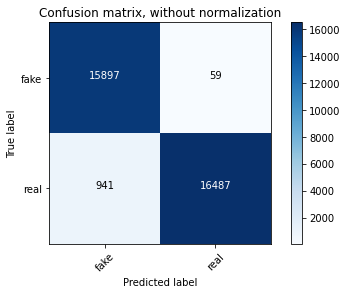

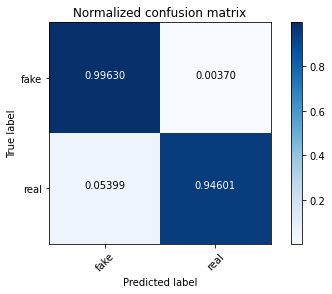

In [30]:
from sklearn.metrics import confusion_matrix
cnf_matrix = confusion_matrix(test, pred)
print(cnf_matrix)
import matplotlib.pyplot as plt
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1, keepdims = True)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.5f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
  
class_names = ['fake', 'real']
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

**8) EER, TPR, FPR**

In [35]:
from sklearn.metrics import auc, roc_curve
fpr, tpr, _ = roc_curve(test, pred, pos_label=1)

fnr = 1 - tpr
fpr_eer = fpr[np.nanargmin(np.absolute((fnr - fpr)))]
fnr_eer = fnr[np.nanargmin(np.absolute((fnr - fpr)))]
eer = min(fpr_eer, fnr_eer)
print("tpr = ", tpr)
print("fpr = ", fpr)
print("eer = ", eer)

tpr =  [0.         0.94600643 1.        ]
fpr =  [0.         0.00369767 1.        ]
eer =  0.0036976685886187014


**9) Đồ thị ROC**

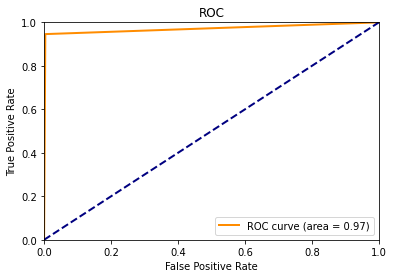

In [34]:
import matplotlib.pyplot as plt
from itertools import cycle
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % auc(fpr, tpr))
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc="lower right")
plt.show()

**10) Test trên 1 tệp ảnh riêng**







> 10.1) Face Dectector using cv2.dnn



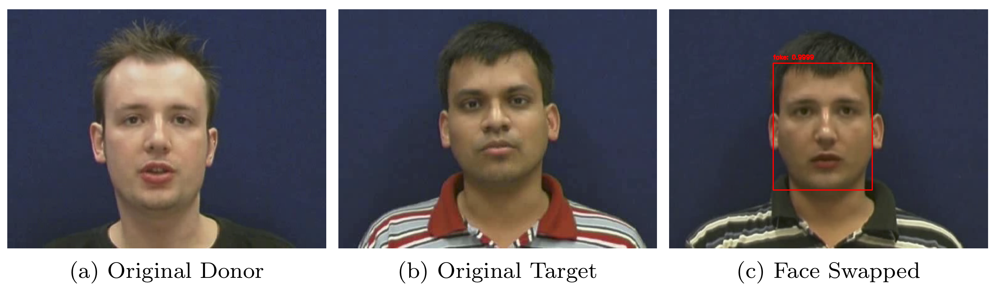

[9.9985433e-01 1.4561729e-04]




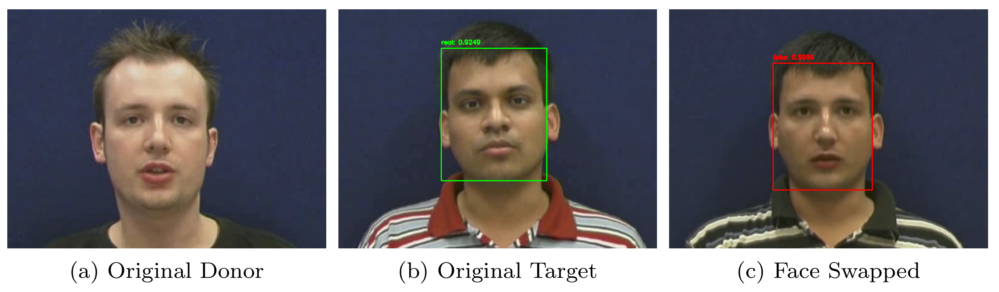

[0.07508657 0.92491347]




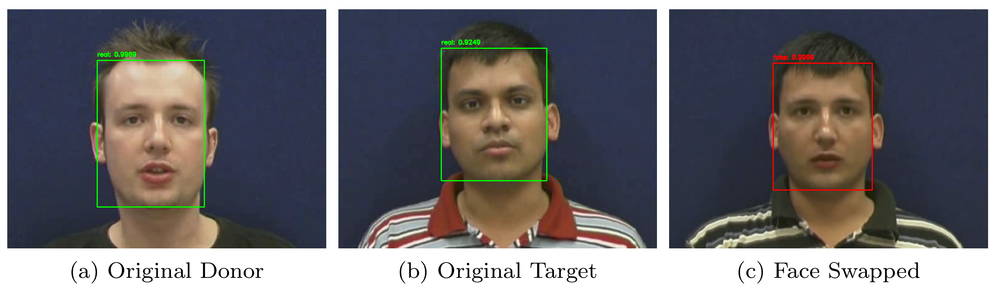

[0.003145 0.996855]




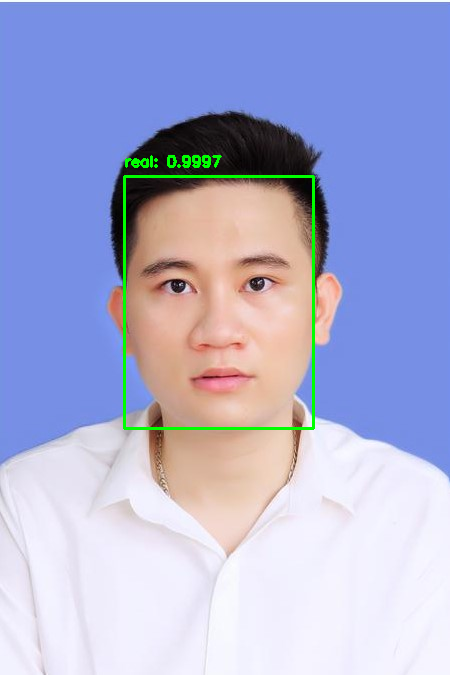

[3.3023555e-04 9.9966979e-01]




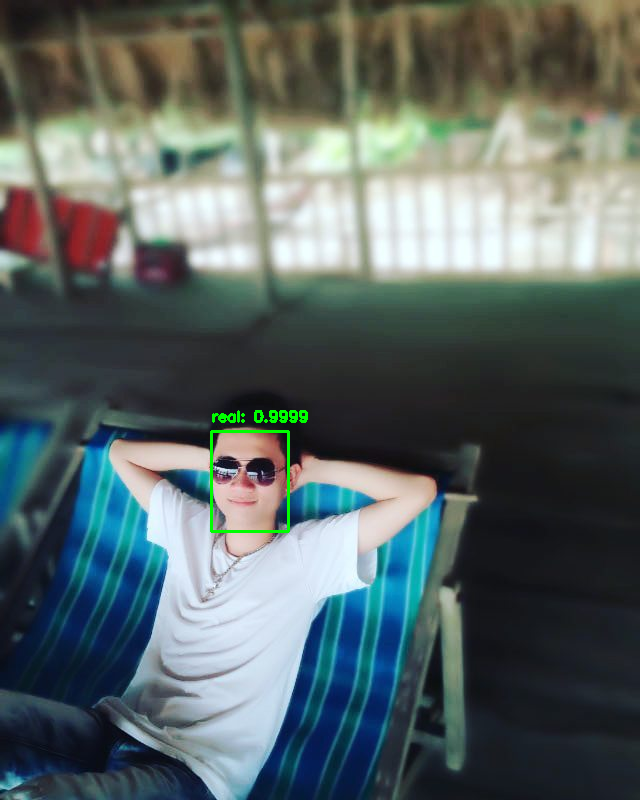

[8.6616274e-05 9.9991333e-01]




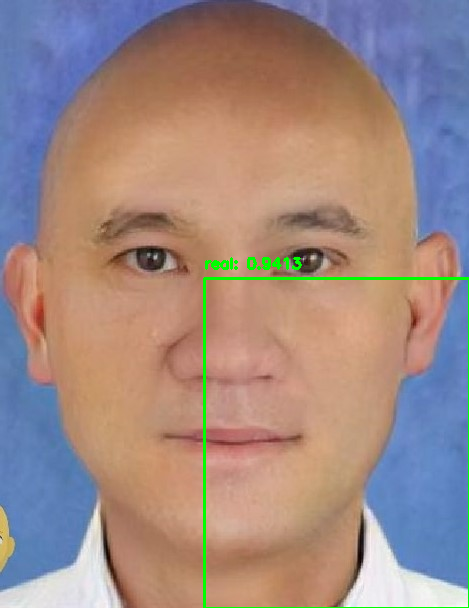

[0.0587268 0.9412732]




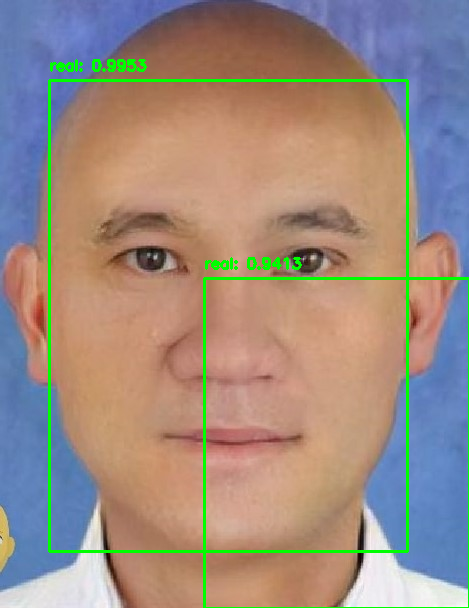

[0.00470252 0.9952975 ]




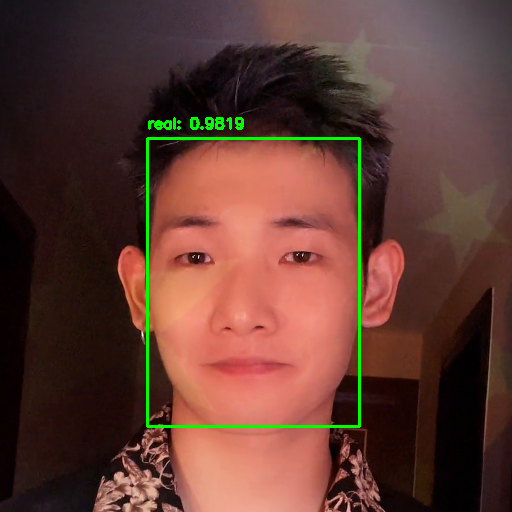

[0.01813713 0.98186284]




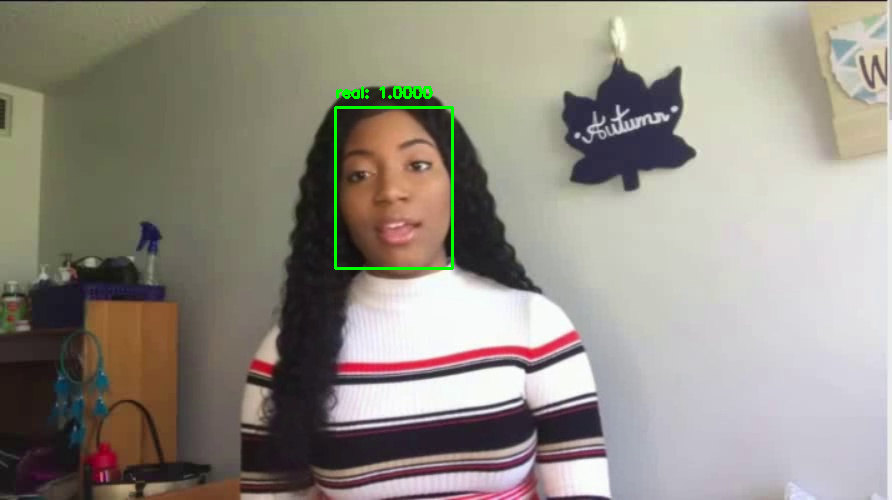

[5.691970e-06 9.999943e-01]




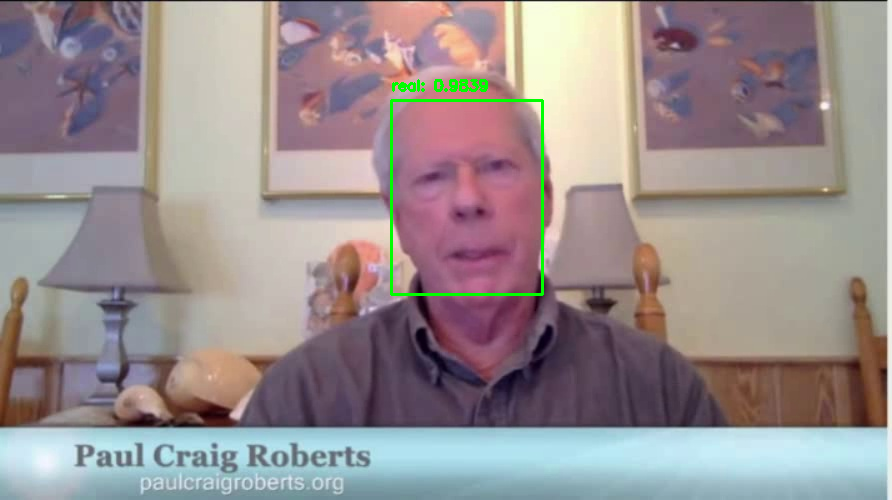

[0.01611333 0.98388666]




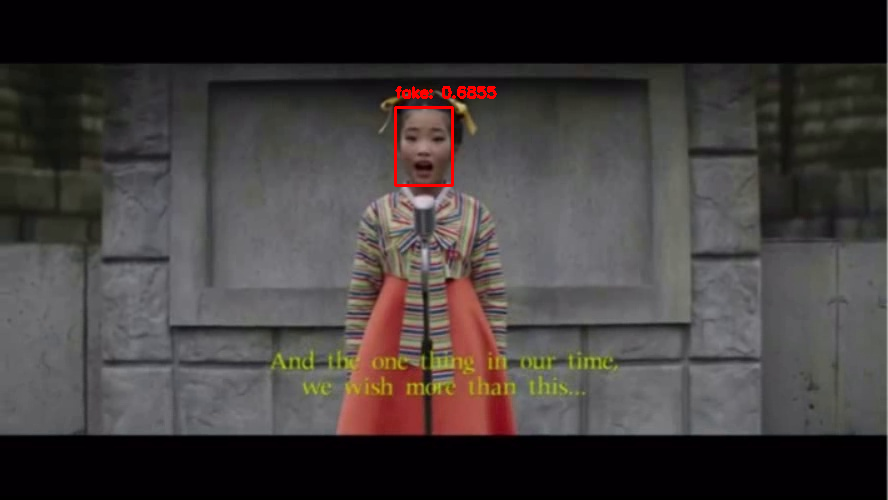

[0.6854526  0.31454742]




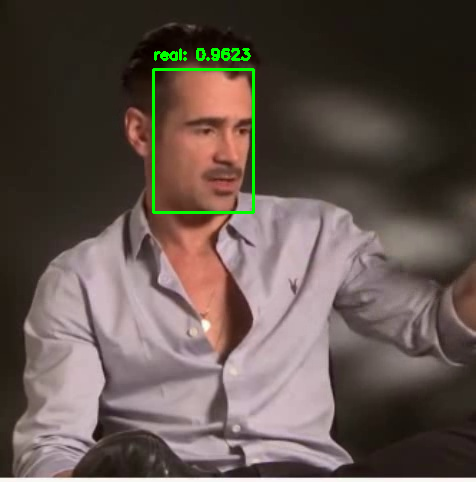

[0.03774269 0.9622573 ]




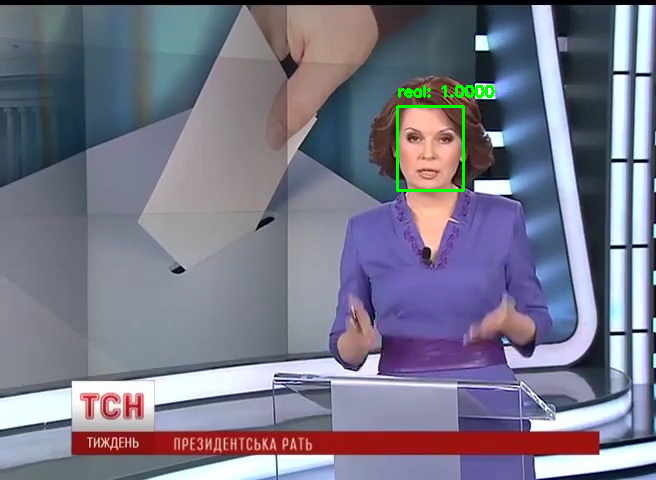

[1.5117185e-13 1.0000000e+00]




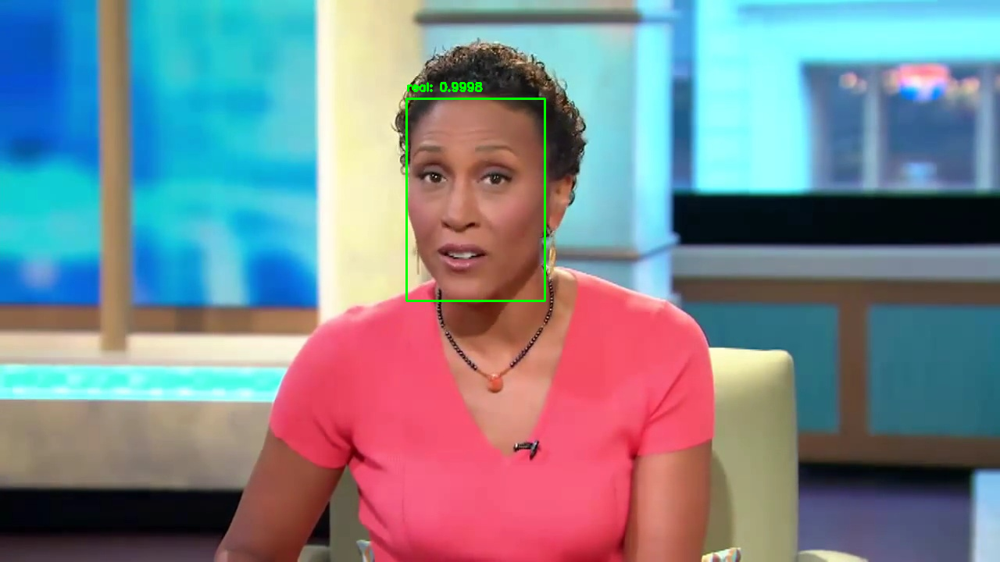

[2.2223957e-04 9.9977773e-01]




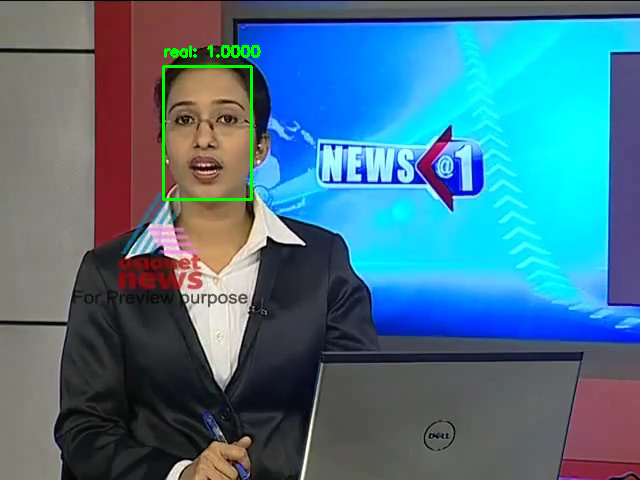

[5.757921e-14 1.000000e+00]




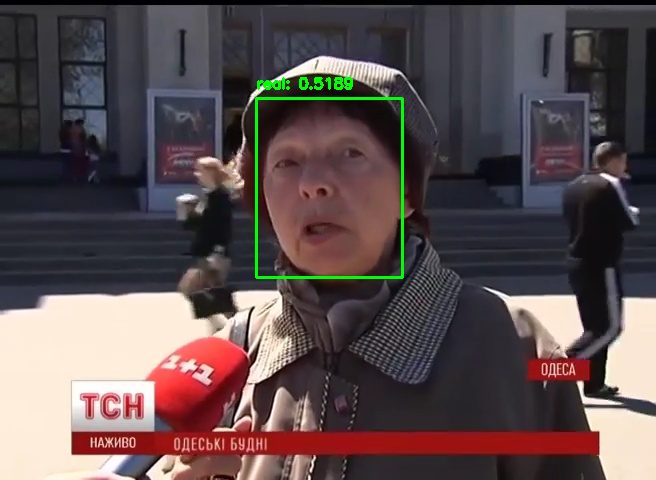

[0.48107022 0.5189298 ]




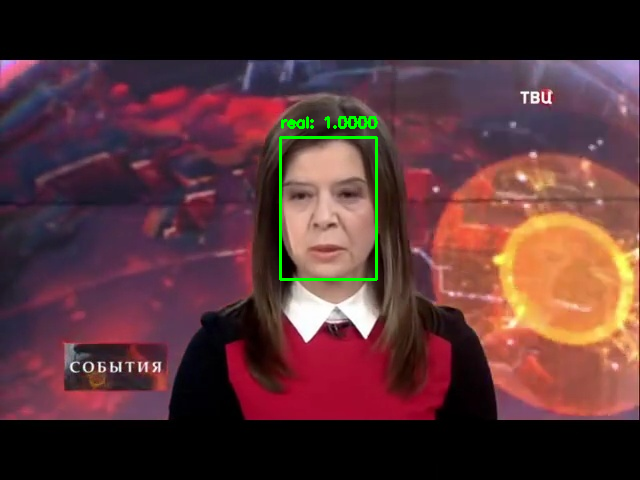

[2.9485376e-17 1.0000000e+00]




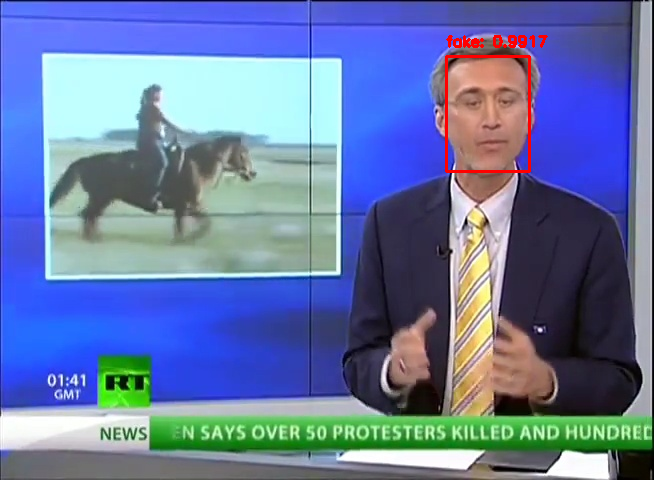

[0.99170506 0.00829496]




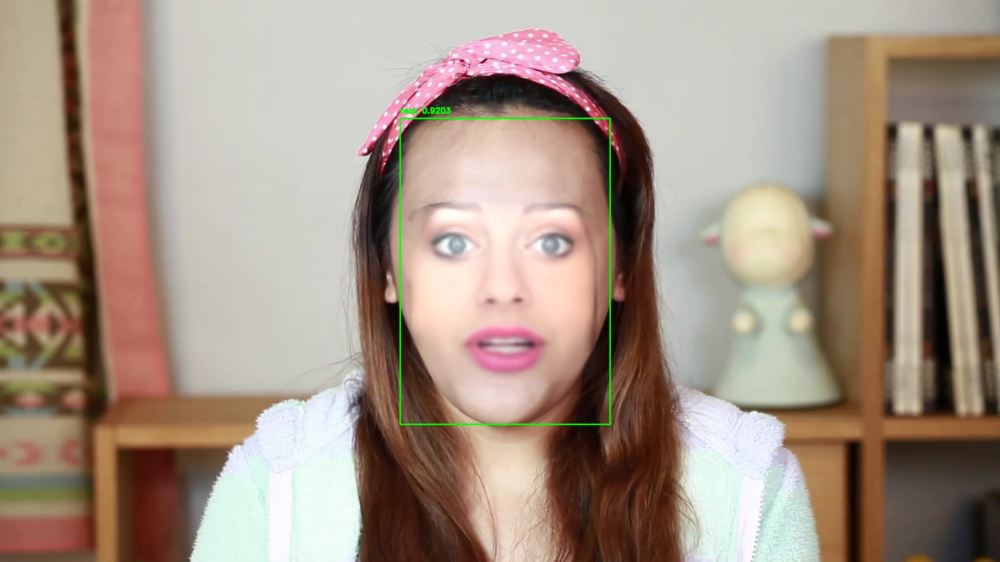

[0.0796946  0.92030543]




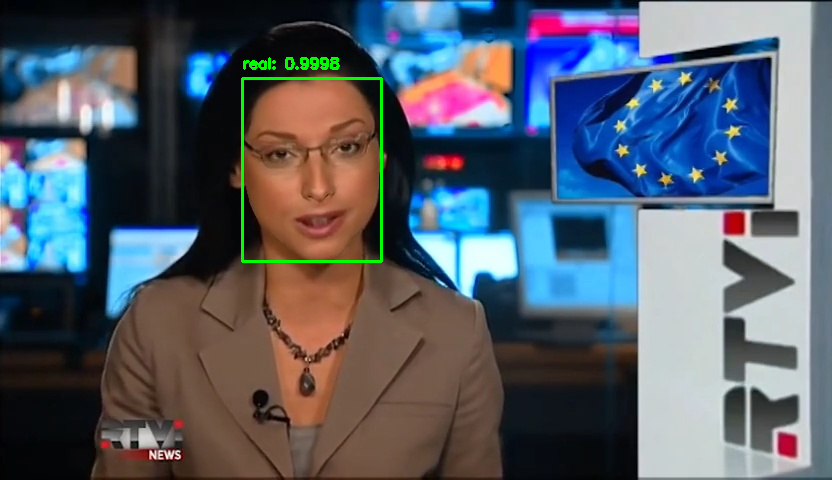

[1.6285066e-04 9.9983716e-01]




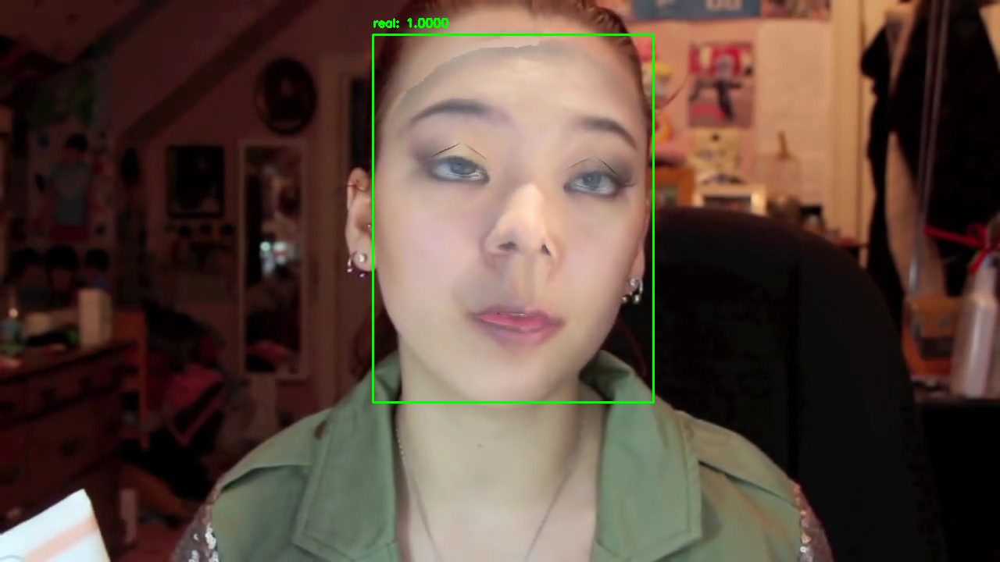

[8.3108462e-06 9.9999166e-01]




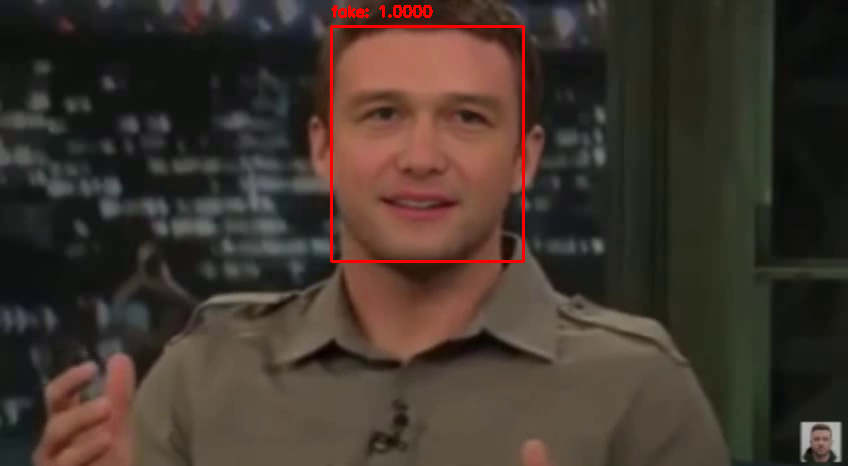

[1.0000000e+00 7.6812344e-15]




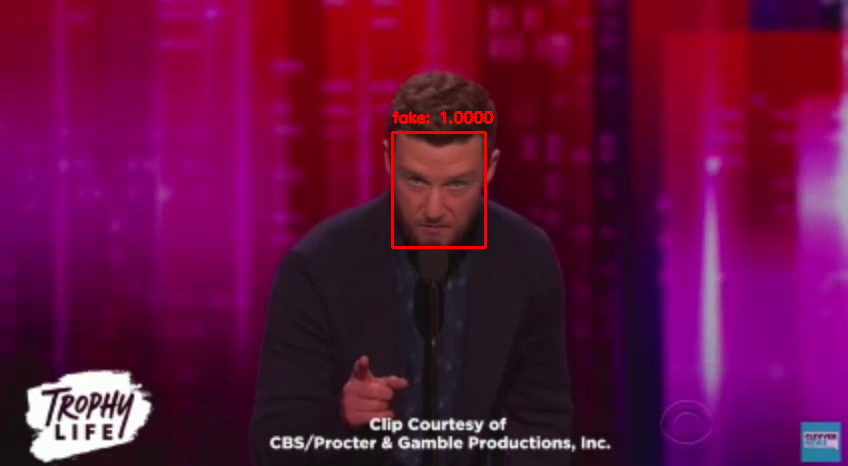

[9.9999833e-01 1.6274957e-06]




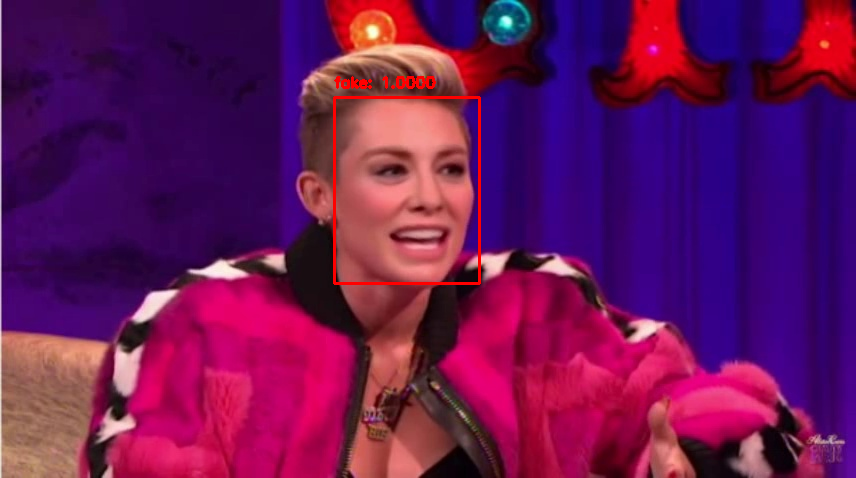

[1.0000000e+00 4.1947345e-08]




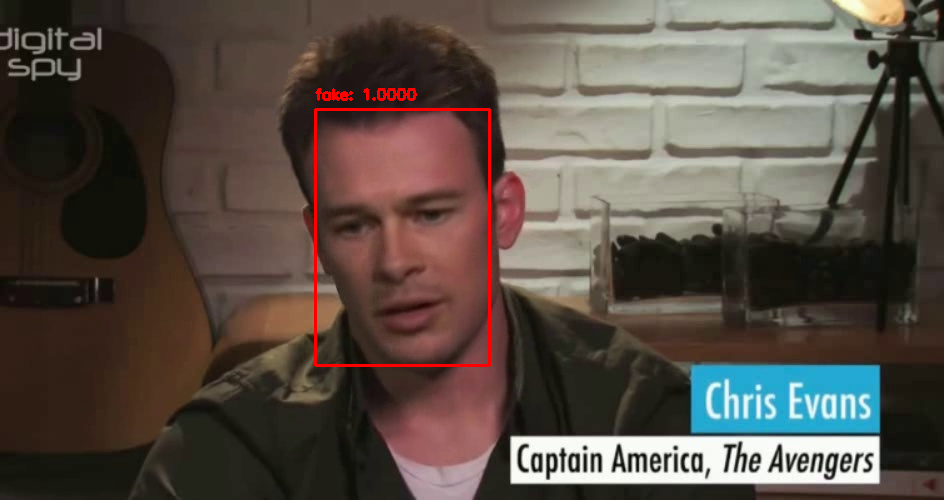

[1.000000e+00 1.114219e-16]




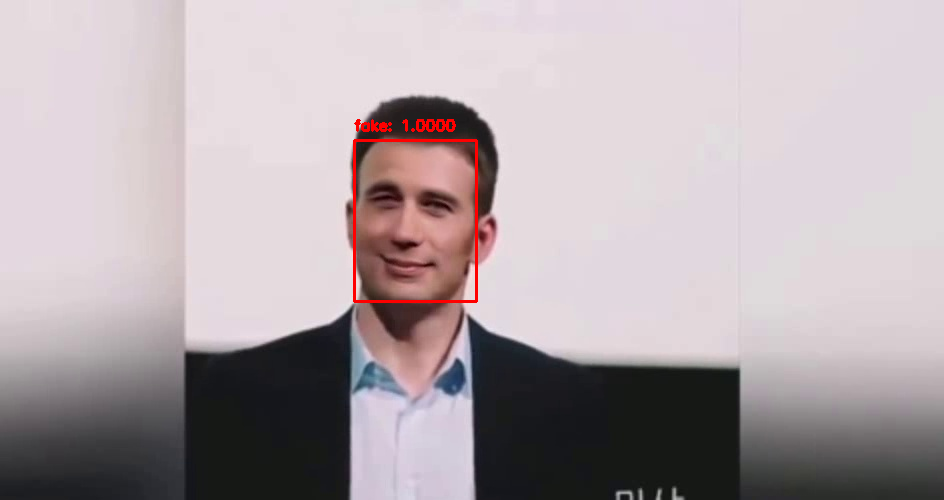

[1.00000e+00 7.21007e-16]




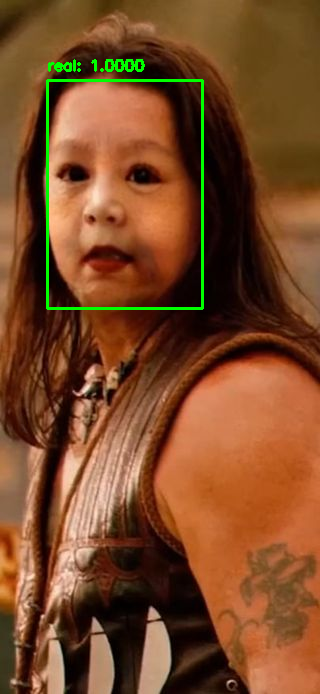

[1.1234885e-10 1.0000000e+00]




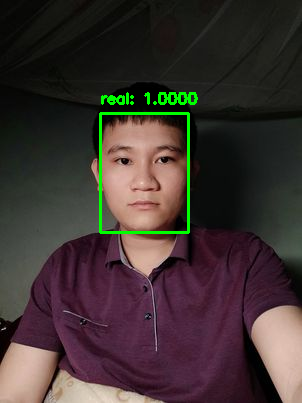

[1.9365046e-08 1.0000000e+00]




In [36]:
import cv2
import glob
from keras.preprocessing.image import img_to_array
from google.colab.patches import cv2_imshow
import pickle
import numpy as np

net = cv2.dnn.readNetFromCaffe('/content/drive/MyDrive/deploy.prototxt',
                               '/content/drive/MyDrive/res10_300x300_ssd_iter_140000.caffemodel')
folder = glob.glob('/content/drive/MyDrive/test_img/*.*')
for file in folder:
  frame = cv2.imread(file)
  (h, w) = frame.shape[:2]
  le = pickle.loads(open('/content/le.pickle', "rb").read())
  blob = cv2.dnn.blobFromImage(cv2.resize(frame, (300, 300)), 1.0, (300, 300), (104.0, 177.0, 123.0))
  # Phat hien khuon mat
  net.setInput(blob)
  detections = net.forward()

  # Loop qua cac khuon mat
  for i in range(0, detections.shape[2]):
    confidence = detections[0, 0, i, 2]

    # Neu conf lon hon threshold
    if confidence > 0.5:
      box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
      (startX, startY, endX, endY) = box.astype("int")
      startX = max(0, startX)
      startY = max(0, startY)
      endX = min(w, endX)
      endY = min(h, endY)

      # Lay vung khuon mat
      face = frame[startY:endY, startX:endX]
      try:
        face = cv2.resize(face, (224,224))
      except Exception as e:
        continue
      face = face.astype("float") / 255.0
      face = img_to_array(face)
      face = np.expand_dims(face, axis=0)

      # Dua vao model de nhan dien fake/real
      face_preds = model.predict(face)[0]
      j = np.argmax(face_preds)
      label = le.classes_[j]

      # Ve hinh chu nhat quanh mat
      label = "{}: {:.4f}".format(label, face_preds[j])
      if (j==0):
        # Neu la fake thi ve mau do
        cv2.putText(frame, label, (startX, startY - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)
        cv2.rectangle(frame, (startX, startY), (endX, endY), (0, 0, 255), 2)
      else:
        # Neu real thi ve mau xanh
        cv2.putText(frame, label, (startX, startY - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        cv2.rectangle(frame, (startX, startY), (endX, endY), (0,  255,0), 2)
      cv2_imshow(frame)
      print(face_preds)
      print('\n')
